<a href="https://colab.research.google.com/github/DarekGit/FACES_DNN/blob/master/notebooks/03_03_FACES_DD_TEST.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

---

[Spis treści](https://github.com/DarekGit/FACES_DNN/blob/master/notebooks/Praca_Dyplomowa.ipynb) | [1. Wstęp](01_00_Wstep.ipynb) | [2. Metryki oceny detekcji](02_00_Miary.ipynb) | [3 .Bazy danych](03_00_Datasety.ipynb) | [4. Przegląd metod detekcji](04_00_Modele.ipynb) | [5. Detekcja twarzy z wykorzystaniem wybranych architektur GSN](05_00_Modyfikacje.ipynb) | [6. Porównanie modeli](06_00_Porownanie.ipynb) | [7. Eksport modelu](07_00_Eksport_modelu.ipynb) | [8. Podsumowanie i wnioski](08_00_Podsumowanie.ipynb) | [Bibliografia](Bibliografia.ipynb)


---
<br>

[3.3 FACES_DD](03_03_FACES_DD.ipynb)  


## Opracowanie datasetu FACES_DD 

In [ ]:
!pip install gdown
import gdown
url = 'https://drive.google.com/uc?export=download&id=1XwVm-2EMFdy9Zq39pKFr5UoSJvgTOm-7'
output = 'Faces_DD.zip'
gdown.download(url, output, False)
!unzip -o Faces_DD.zip
!rm Faces_DD.zip

In [ ]:
from PIL import Image, ImageDraw
import pandas as pd
import numpy as np
import torch
import os
import json

import matplotlib.pyplot as plt
from matplotlib.patches import Ellipse
from matplotlib import collections as mc

from torch.utils.data import Dataset, DataLoader

##Odtworzenie metryki Faces_DD

In [ ]:
!pip install gdown
import gdown

url = 'https://drive.google.com/uc?export=download&id=1gIIUK518Ft9zi3VDVQZLRVozI-Hkpgt2'
output = 'Faces_DD_metrics.json'
gdown.download(url, output, False)
with open('Faces_DD_metrics.json','r') as f:
  Faces_DD=json.load(f)

Downloading...
From: https://drive.google.com/uc?export=download&id=1gIIUK518Ft9zi3VDVQZLRVozI-Hkpgt2
To: /content/Faces_DD_metrics.json
100%|██████████| 336k/336k [00:00<00:00, 56.5MB/s]


In [ ]:
Faces_DD[10]

{'depth': 3,
 'grey': False,
 'marks': [[1014.0, 504.0, 1174.0, 711.0],
  [448.0, 545.0, 568.0, 685.0],
  [605.0, 1106.0, 717.0, 1236.0],
  [694.0, 634.0, 801.0, 753.0]],
 'mean_std': [[120.13626572107435, 108.362532642924, 99.86483683920541],
  [69.45270481118739, 68.85858604223439, 72.785191769202]],
 'ori_size': [1728, 2304],
 'path': 'Faces_DD/2004/IMGP1109.JPG',
 'persons': ['KWD', 'Other', 'ZBD', 'Other']}

In [ ]:
sizes, nf = [],0
size_hist = {}
for i,im in enumerate(Faces_DD):
  nf += len(im['marks'])
  sizes.append(im['ori_size'])
for s in sorted(sizes):
  if not str(s) in size_hist.keys(): size_hist.update({str(s): 0})
  size_hist[str(s)] += 1
print('ilosc zdjec {}, ilosc oznaczonych twarzy {}, rozmiary zdjec:'.format(i+1,nf))
[(s,n) for s,n in size_hist.items() if n >10]

ilosc zdjec 925, ilosc oznaczonych twarzy 2690, rozmiary zdjec:


[('[1728, 2304]', 51),
 ('[1920, 2560]', 60),
 ('[1944, 2592]', 30),
 ('[2304, 1728]', 30),
 ('[2448, 3264]', 303),
 ('[2560, 1920]', 66),
 ('[2592, 1944]', 39),
 ('[3072, 2304]', 22),
 ('[3264, 2448]', 256)]

In [ ]:
import pandas as pd
hist=dict(); hists={}
for m in Faces_DD:
  f=len(m['marks'])
  hist[f]= 1 +hist.get(f,0)

pd.DataFrame(sorted([*zip(hist.keys(),hist.values())]), index=None, columns=['ilosc twarzy','ilosc obrazow'])

,ilosc twarzy,ilosc obrazow
0,0,2
1,1,420
2,2,230
3,3,91
4,4,55
5,5,36
6,6,14
7,7,17
8,8,12
9,9,11


In [ ]:
img_sizes=set()
for m in Faces_DD:
  img_sizes.add( tuple(m['ori_size']))

print('ilosc grup rozmiarow obrazow: ',len(img_sizes))

ilosc grup rozmiarow obrazow:  52


In [ ]:
persons=[]
for m in Faces_DD:
  for p in m['persons']:
    persons.append(p)
hist=dict()
for m in persons:
  hist[m]= 1 +hist.get(m,0)
list(set(persons)), hist, sum([n for p,n in hist.items() if p != 'Other'])

(['Other', 'ZD', 'AS', 'BO', 'OO', 'TM', 'RO', 'ZBD', 'AM', 'KWD', 'DD'],
 {'AM': 11,
  'AS': 6,
  'BO': 24,
  'DD': 186,
  'KWD': 307,
  'OO': 27,
  'Other': 1485,
  'RO': 22,
  'TM': 10,
  'ZBD': 583,
  'ZD': 29},
 1205)

In [ ]:
import json

url = 'https://drive.google.com/uc?export=download&id=1gIIUK518Ft9zi3VDVQZLRVozI-Hkpgt2'
output = 'Faces_DD_metrics.json'
gdown.download(url, output, False)
with open('Faces_DD_metrics.json','r') as f:
  Faces_DD=json.load(f)

Downloading...
From: https://drive.google.com/uc?export=download&id=1gIIUK518Ft9zi3VDVQZLRVozI-Hkpgt2
To: /content/Faces_DD_metrics.json
100%|██████████| 336k/336k [00:00<00:00, 78.3MB/s]


In [ ]:
# odtworzenie zapisanej metryki
import json
with open('Faces_DD_metrics.json','r') as f:
  Faces_DD=json.load(f)

In [ ]:
Faces_DD[0]

{'depth': 3,
 'grey': False,
 'marks': [[488.0, 658.0, 1414.0, 1778.0]],
 'mean_std': [[120.13626572107435, 108.362532642924, 99.86483683920541],
  [69.45270481118739, 68.85858604223439, 72.785191769202]],
 'ori_size': [1944, 2592],
 'path': 'Faces_DD/2004/DSC04759.JPG',
 'persons': ['ZBD']}

Display images function with remarks

In [ ]:
def plot_marks(img,metric,dbxs=[],figsize=(14,14)): 

  fig, ax = plt.subplots(1,1,figsize=figsize); ax.imshow(img)
  Ms=np.array(metric['marks'])
  color,color_det,lw=('white','red',1)
  for k,dbx in enumerate(metric['marks']):
    annot=str(k)+'  -   '+metric['persons'][k]
    ax.annotate(annot,np.array(dbx[:2])+2,color='k')
    ax.annotate(annot,dbx[:2],color='w')
  if dbxs != []:
    cbox = mc.LineCollection([[[l,t],[r,t],[r,b],[l,b],[l,t]] for l,t,r,b,_ in dbxs], linewidth=lw+1, colors=color_det)
    ax.add_collection(cbox)

  cbox = mc.LineCollection([[[l,t],[r,t],[r,b],[l,b],[l,t]] for l,t,r,b in Ms], linewidth=lw, colors=color)
  ax.add_collection(cbox)
  print(len(metric['marks']),end=',  ')
  print('Annotated Boxes',end=', ')
  print('        '+metric['path'])
  for name in metric['persons']:
    print(name,end=',  ')  
  #plt.axis('off')
  plt.show()

In [ ]:
max([(len(m['marks']),i) for i,m in enumerate(Faces_DD)])

(84, 58)

------------------------  idx   58
84,  Annotated Boxes,         Faces_DD/2004/DSC02628.JPG
KWD,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  

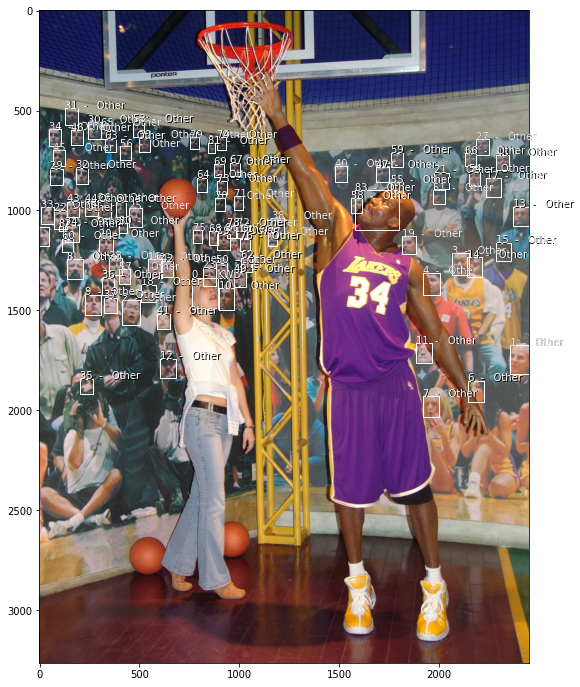

------------------------  idx   233
5,  Annotated Boxes,         Faces_DD/2008/P1050400.JPG
ZBD,  Other,  Other,  Other,  Other,  

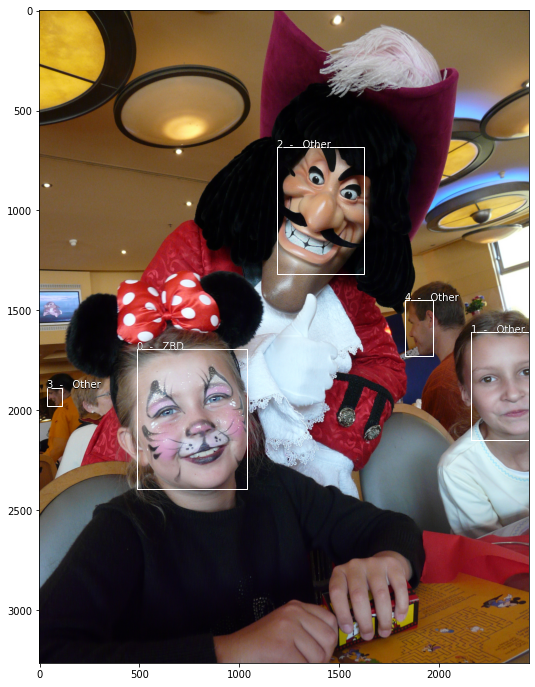

------------------------  idx   388
8,  Annotated Boxes,         Faces_DD/2008/P1030758.JPG
KWD,  KWD,  Other,  Other,  Other,  Other,  Other,  Other,  

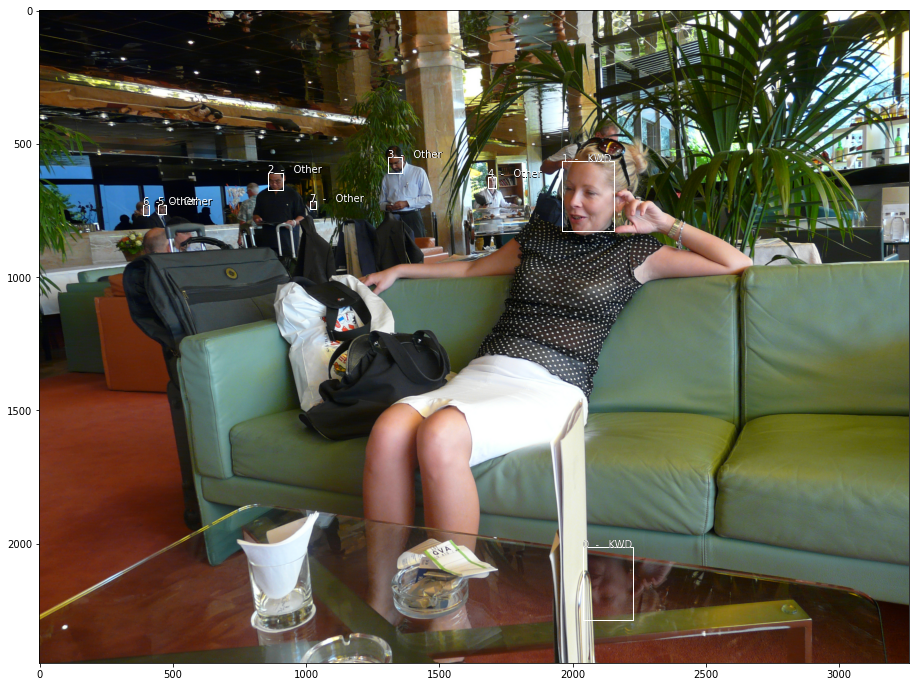

------------------------  idx   424
9,  Annotated Boxes,         Faces_DD/2008/P1020132.JPG
KWD,  ZBD,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  

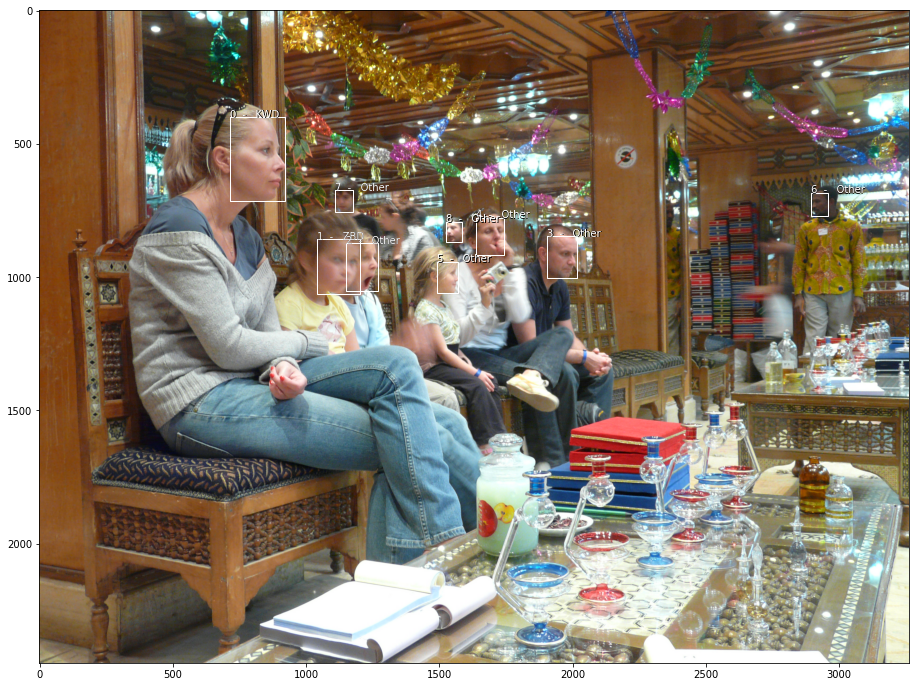

------------------------  idx   446
13,  Annotated Boxes,         Faces_DD/2008/P1030391.JPG
Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  ZBD,  Other,  Other,  

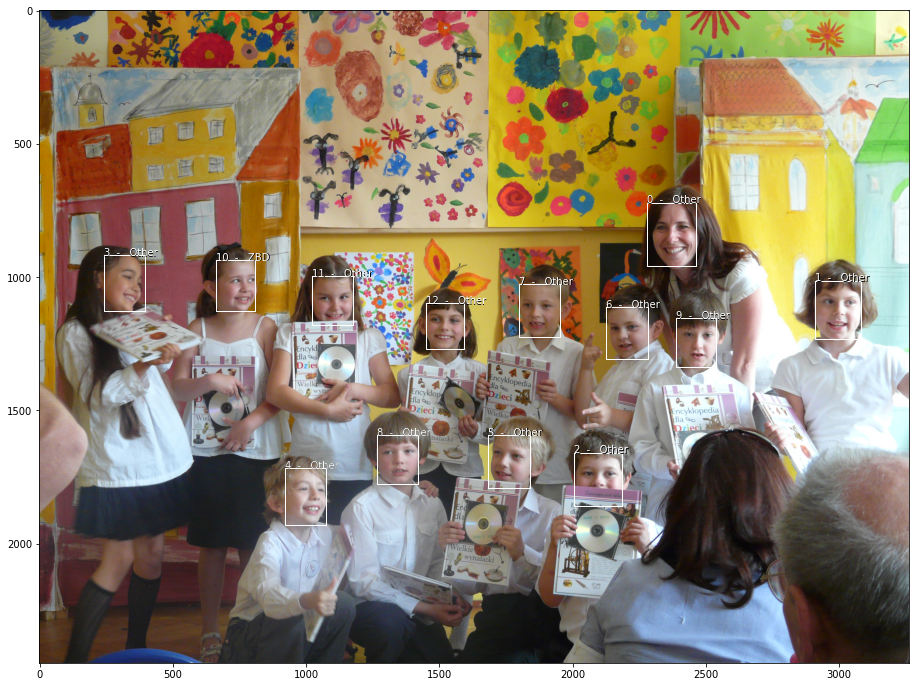

------------------------  idx   722
2,  Annotated Boxes,         Faces_DD/2006/IMGP1199.JPG
ZBD,  ZBD,  

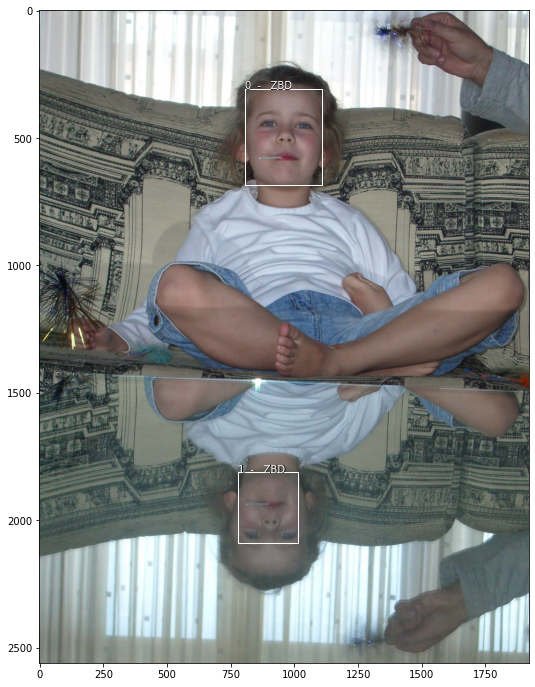

In [ ]:
#for l in [58,233,259,365,388,394,413,424,446,455,483,532,683,709,722,802,809,874,759]:
for l in [58,233,388,424,446,722]:
  m=Faces_DD[l]
  print('------------------------  idx  ',l)
  plot_marks(Image.open(m['path']),m,figsize=(16,12))

In [ ]:
!pip install facenet-pytorch
from facenet_pytorch import MTCNN, InceptionResnetV1

     |████████████████████████████████| 1.9MB 5.6MB/s 


In [ ]:
#inicjalizacja sieci mtcnn, pelny opis dostepny: help(MTCNN)
mtcnn = MTCNN(image_size=224, margin=0, keep_all=True) 

In [ ]:
gbxs=[]; dbxs=[]
for m in Faces_DD:
  path=m['path']
  img=Image.open(path); depth=img.layers
  if depth ==1: img=np.outer(img,np.ones(3)).reshape((img.size[1],img.size[0],3))
  dboxes,confs = mtcnn.detect(img)
  if type(dboxes)!=np.ndarray: dboxes=[]; confs=[]
  dbx=[[*(np.array(bx)+0.5).astype('int'),confs[i]] for i,bx in enumerate(dboxes)]
  dbxs.append(dbx)
  gbxs.append(m['marks'])

All 0.50:   AP: 94.39%   Recall: 95.28%   IoU: 0.50
All 0.00:   AP: 94.60%   Recall: 95.50%   IoU: 0.00
large   :   AP: 95.45%   Recall: 95.55%   IoU: 0.50
medium  :   AP: 91.56%   Recall: 93.92%   IoU: 0.50
small   :   AP: 73.44%   Recall: 97.39%   IoU: 0.50


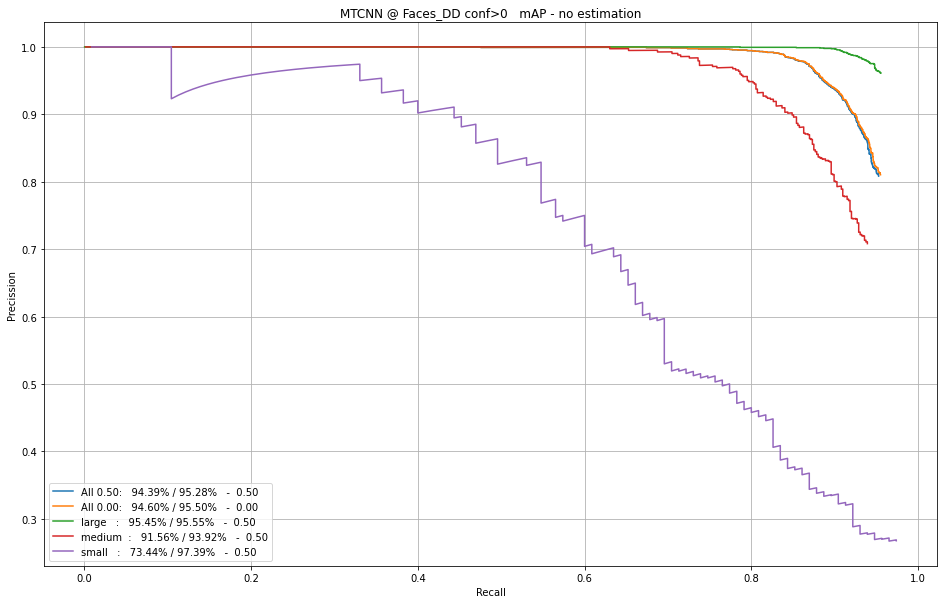

In [ ]:
import numpy as np
import json

!wget -q -O mAP.py https://drive.google.com/uc?id=1PtEsobTFah3eiCDbSsYblOGbe2fmkjGR
from mAP import mAP, plot_mAP


IoUs=[.5,.55,.6,.65,.7,.75,.8,.85,.9,.95,.0]
m,d=mAP(gbxs,dbxs,data=True)
plot_mAP(m,d,['All 0.50','All 0.00','large','medium','small'],1,'MTCNN @ Faces_DD conf>0  ',file='MTCNN_Faces_DD_mAP')

------------------------  idx   58   gtx/dbxs 84 / 86
84,  Annotated Boxes,         Faces_DD/2004/DSC02628.JPG
KWD,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  

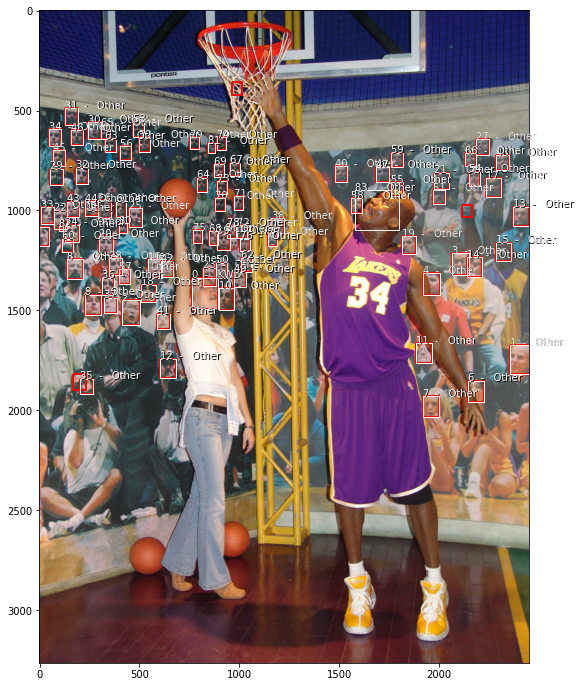

------------------------  idx   233   gtx/dbxs 5 / 5
5,  Annotated Boxes,         Faces_DD/2008/P1050400.JPG
ZBD,  Other,  Other,  Other,  Other,  

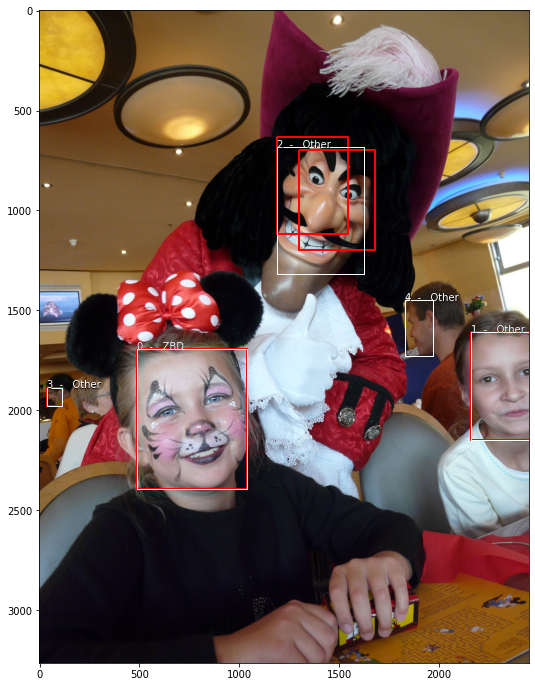

------------------------  idx   388   gtx/dbxs 8 / 8
8,  Annotated Boxes,         Faces_DD/2008/P1030758.JPG
KWD,  KWD,  Other,  Other,  Other,  Other,  Other,  Other,  

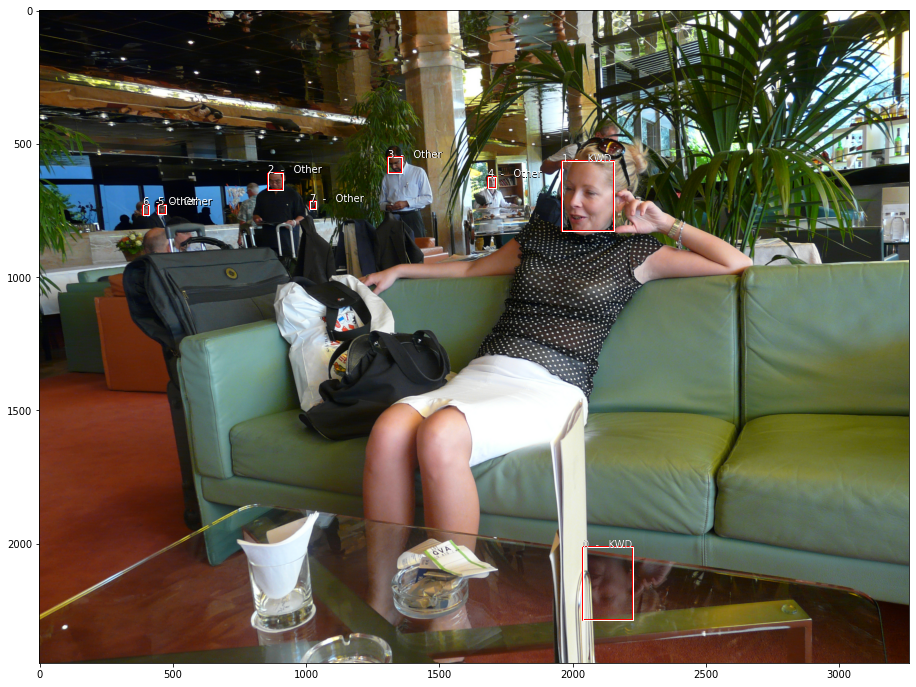

------------------------  idx   424   gtx/dbxs 9 / 9
9,  Annotated Boxes,         Faces_DD/2008/P1020132.JPG
KWD,  ZBD,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  

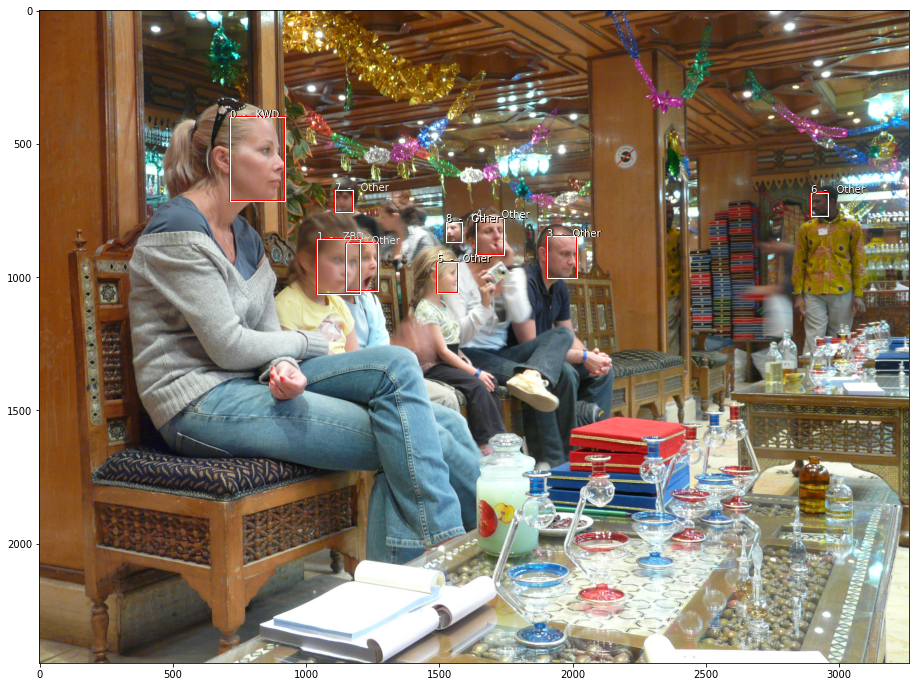

------------------------  idx   446   gtx/dbxs 13 / 17
13,  Annotated Boxes,         Faces_DD/2008/P1030391.JPG
Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  Other,  ZBD,  Other,  Other,  

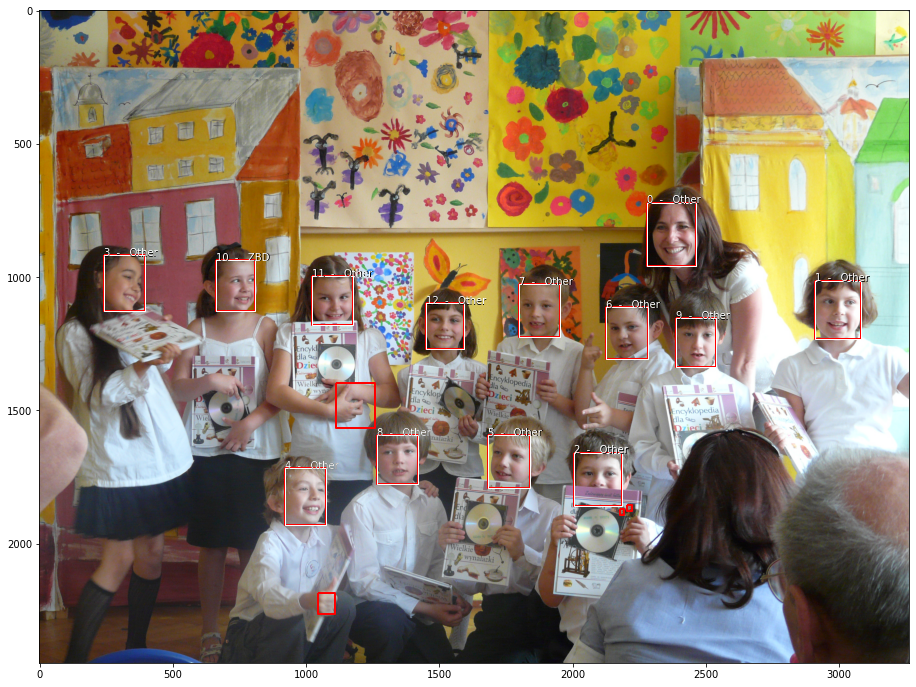

------------------------  idx   722   gtx/dbxs 2 / 5
2,  Annotated Boxes,         Faces_DD/2006/IMGP1199.JPG
ZBD,  ZBD,  

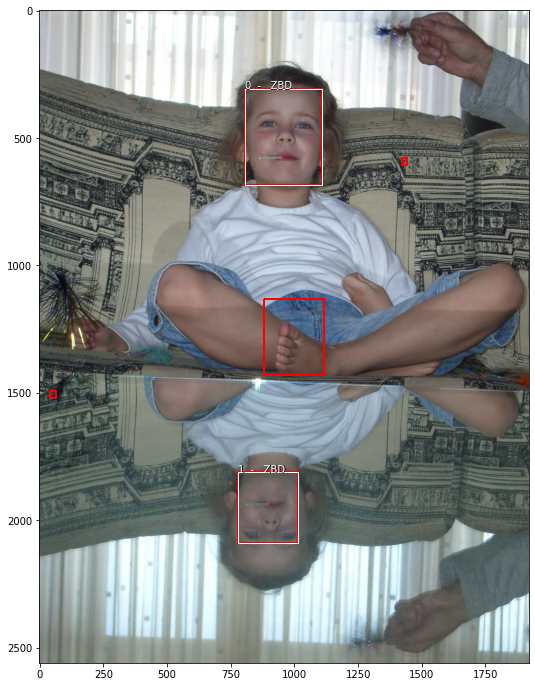

In [ ]:
#for l in [58,233,259,365,388,394,413,424,446,455,483,532,683,709,722,802,809,874,759]:
for l in [58,233,388,424,446,722]:
  m=Faces_DD[l]
  print('------------------------  idx  ',l,'  gtx/dbxs',len(m['marks']),'/',len(dbxs[l]))
  plot_marks(Image.open(m['path']),m,dbxs[l],figsize=(16,12))

In [ ]:
#ekstrakcja twarzy do katalogu <root> w strukturze ImageFolder
root='Faces_Folder/'
margin=.2 #additional margin to box anottation in total

Pset=set()
[[Pset.add(p) for p in d['persons']] for d in Faces_DD]
Pset.discard('Other')
for i,p in enumerate(Pset):
  os.makedirs(root+p,exist_ok=True)
print('stworzono {} folderow w {} - {}'.format(i+1,root,Pset))


Faces_Folder=[]
for l,d in enumerate(Faces_DD):
  img=Image.open(d['path'])
  size=img.size
  for i in range(len(d['marks'])):
      if d['persons'][i]=='Other': continue
      orig_box=np.array(d['marks'][i],dtype=int) #increased by margin% symetrically
      hm = (orig_box[3]-orig_box[1])*margin//2
      wm = (orig_box[2]-orig_box[0])*margin//2

      box= orig_box.copy()
      box[0] = orig_box[0]-wm if orig_box[0]-wm >0 else 0
      box[1] = orig_box[1]-hm if orig_box[1]-hm >0 else 0
      box[2] = orig_box[2]+wm if orig_box[2]+wm < size[0] else size[0]
      box[3] = orig_box[3]+hm if orig_box[3]+hm < size[1] else size[1]

      path=root+d['persons'][i]+'/'+d['persons'][i]+'_'+str(l)+'_'+str(i)+'.jpg'
      img.crop(box).save(path)
      Faces_Folder.append(
                        {'Faces_DD':{'path':d['path'],
                                      'img_idx':int(l),
                                      'face_idx':int(i),
                                      'orig_box': [int(x) for x in orig_box],
                                      'margin' : margin,
                                      'box' : [int(x) for x in box], 
                                      },
                          'path':path,
                          'person':d['persons'][i],

                          }
      )

import json
with open(root+'Faces_Folder.json','w') as f:
  json.dump(Faces_Folder,f)

N_faces={}
for p in  Faces_Folder:
  if p['person'] in N_faces.keys(): 
    N_faces[p['person']]+=1
  else:
    N_faces[p['person']]=1
N_faces, sum(N_faces.values())

stworzono 10 folderow w Faces_Folder/ - {'OO', 'RO', 'TM', 'BO', 'DD', 'ZD', 'ZBD', 'KWD', 'AS', 'AM'}


({'AM': 11,
  'AS': 6,
  'BO': 24,
  'DD': 186,
  'KWD': 307,
  'OO': 27,
  'RO': 22,
  'TM': 10,
  'ZBD': 583,
  'ZD': 29},
 1205)

<br>

---

[Spis treści](https://github.com/DarekGit/FACES_DNN/blob/master/notebooks/Praca_Dyplomowa.ipynb) | [1. Wstęp](01_00_Wstep.ipynb) | [2. Metryki oceny detekcji](02_00_Miary.ipynb) | [3 .Bazy danych](03_00_Datasety.ipynb) | [4. Przegląd metod detekcji](04_00_Modele.ipynb) | [5. Detekcja twarzy z wykorzystaniem wybranych architektur GSN](05_00_Modyfikacje.ipynb) | [6. Porównanie modeli](06_00_Porownanie.ipynb) | [7. Eksport modelu](07_00_Eksport_modelu.ipynb) | [8. Podsumowanie i wnioski](08_00_Podsumowanie.ipynb) | [Bibliografia](Bibliografia.ipynb)


---